In [ ]:
# Cell 1: Install necessary packages
!pip install ultralytics easyocr opencv-python numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 52.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 83.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 58.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 73.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4

In [ ]:
# Cell 2: Import Libraries
import cv2
import numpy as np
import easyocr
from ultralytics import YOLO
import matplotlib.pyplot as plt

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# Cell 3: Initialize Models
# Load YOLOv8 model (you can replace 'yolov8n.pt' with your custom model if available)
yolo_model = YOLO('yolov8n.pt')

# Initialize EasyOCR
ocr_reader = easyocr.Reader(['en'], gpu=False)

100%|██████████| 6.25M/6.25M [00:00<00:00, 108MB/s]


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [ ]:
# Cell 4: Helper function to display frames inside notebook
def show_image(img, title="Output"):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(title)
    plt.show()


0: 384x640 1 car, 103.9ms
Speed: 2.6ms preprocess, 103.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


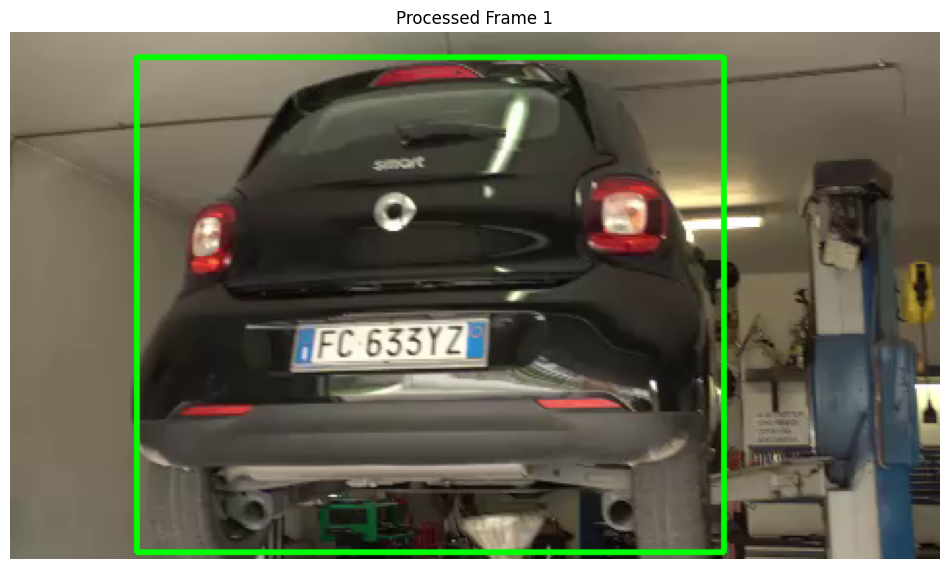


0: 384x640 1 car, 129.9ms
Speed: 1.9ms preprocess, 129.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


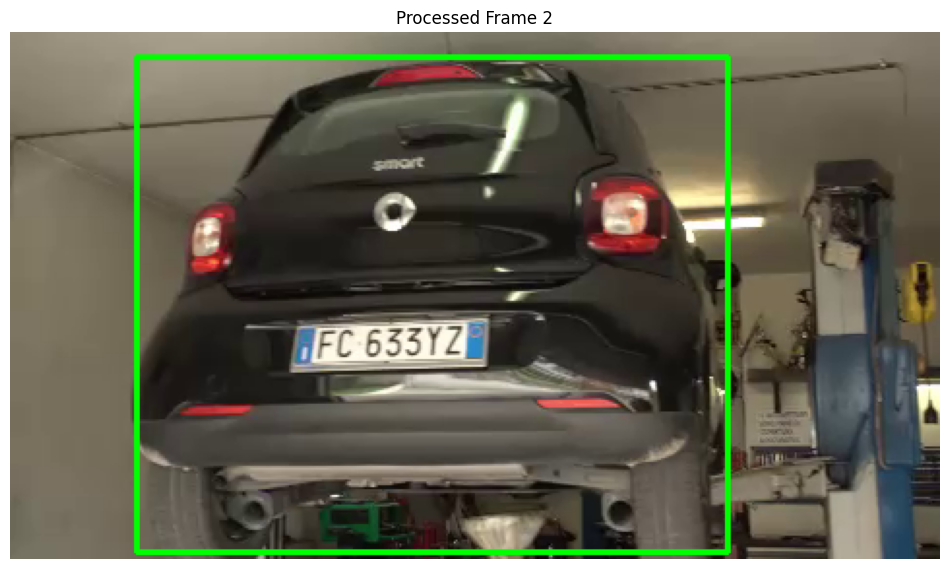


0: 384x640 1 car, 125.6ms
Speed: 2.0ms preprocess, 125.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Frame 3: OCR Detected Text: FC 633Y2_


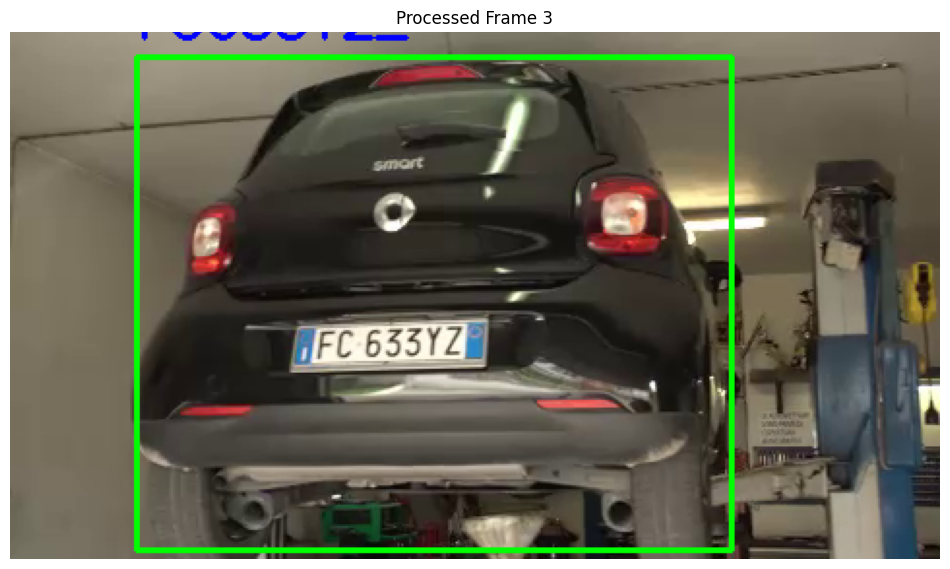


0: 384x640 1 car, 130.7ms
Speed: 1.9ms preprocess, 130.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Frame 4: OCR Detected Text: FC 633YZ


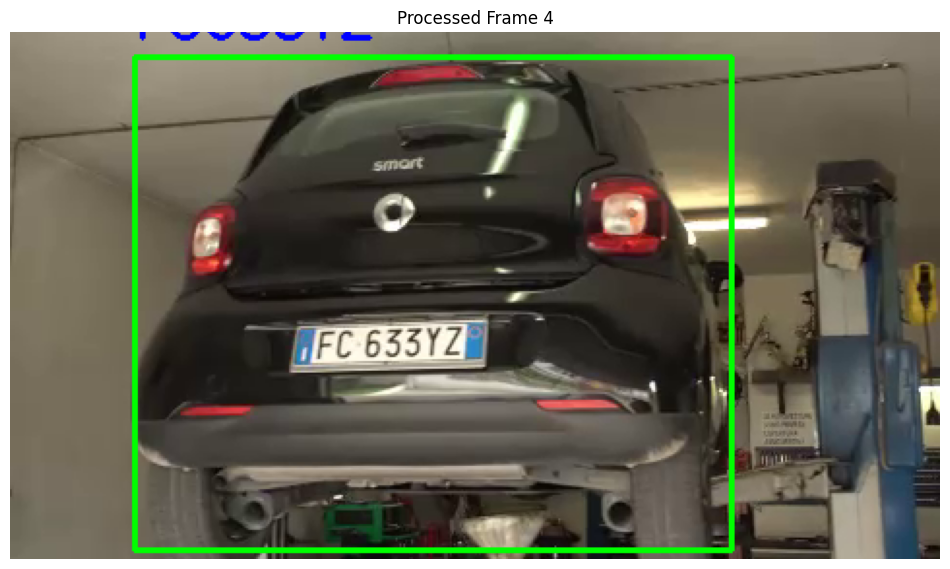


0: 384x640 1 car, 126.6ms
Speed: 2.6ms preprocess, 126.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Frame 5: OCR Detected Text: FC 633Y2


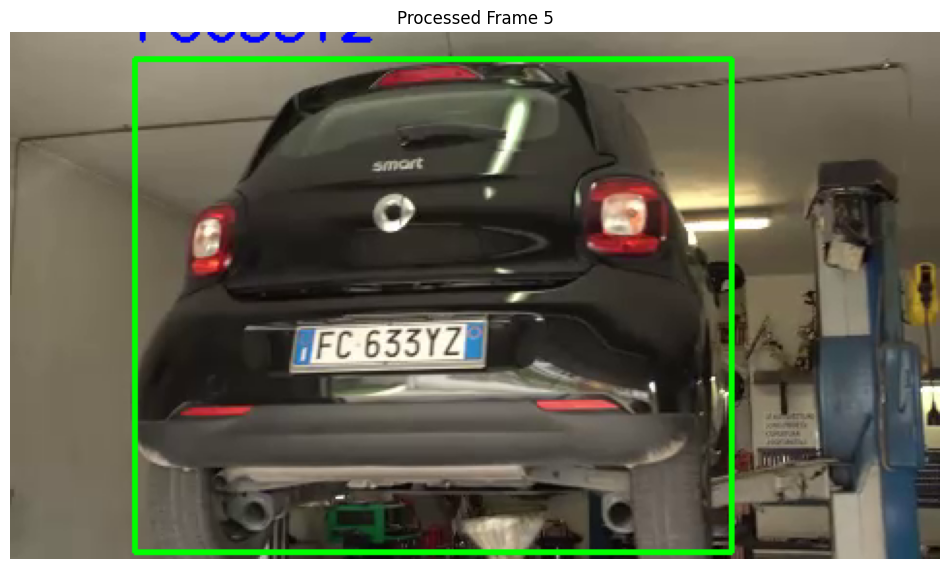


Detected Number Plates from all frames:
Frame 1: No plate detected
Frame 2: No plate detected
Frame 3: FC 633Y2_
Frame 4: FC 633YZ
Frame 5: FC 633Y2


In [ ]:
# Cell 5: Process the video
# Provide path to your input video
video_path = r"1.mp4"  # <-- change this to your video file
cap = cv2.VideoCapture(video_path)
frame_count = 0

# List to store detected number plates for each frame
all_detected_plates = []

# Process first 5 frames
while cap.isOpened() and frame_count < 5:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # YOLOv8 Detection on the frame
    results = yolo_model(frame)

    detected_texts = []  # Temporary list for current frame

    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        clss = result.boxes.cls.cpu().numpy()

        for box, conf, cls in zip(boxes, confs, clss):
            x1, y1, x2, y2 = map(int, box)
            # Draw YOLO box
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Crop detected region
            crop = frame[y1:y2, x1:x2]

            # OCR Detection on cropped region
            ocr_result = ocr_reader.readtext(crop)

            # Extract and store OCR result
            for (bbox, text, prob) in ocr_result:
                if prob > 0.5:
                    detected_texts.append(text)  # Store detected text

                    # Display OCR result on the frame
                    cv2.putText(frame, text.replace(" ", ""), (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    print(f"Frame {frame_count}: OCR Detected Text: {text}")

    # Store detected plate without spaces for this frame
    full_plate = "".join(detected_texts) if detected_texts else "No plate detected"
    all_detected_plates.append(full_plate)

    # Display frame inside notebook
    show_image(frame, title=f"Processed Frame {frame_count}")

cap.release()

# Print detected plates after processing all frames
print("\nDetected Number Plates from all frames:")
for i, plate in enumerate(all_detected_plates, 1):
    print(f"Frame {i}: {plate}")

In [ ]:
import pandas as pd

# Load the Excel file
excel_path = "Vehicle License plate (2).xlsx"  # Update this to your actual file path
df = pd.read_excel(excel_path)

# Ensure column name matches exactly
column_name = "License Plate"  # Match this exactly with the Excel column

# Print all values in the column before checking
print("License Plate Column from Excel:")
print(df[column_name])

# Normalize authorized vehicles (convert to uppercase and remove spaces)
authorized_vehicles = set(df[column_name].astype(str).str.replace(" ", "").str.upper())

# Print cleaned authorized vehicles for verification
print("\nCleaned Authorized Vehicles:")
print(authorized_vehicles)

# Normalize detected plates (convert to uppercase and remove spaces)
normalized_detected_plates = {plate.replace(" ", "").upper() for plate in all_detected_plates}

# Print cleaned detected plates for debugging
print("\nNormalized Detected Plates:")
print(normalized_detected_plates)

# Check if any detected plate matches an authorized one
if any(plate in authorized_vehicles for plate in normalized_detected_plates):
    print("\nAuthorized Vehicle")
else:
    print("\nUnauthorized Vehicle")


License Plate Column from Excel:
0      CA455822
1       DS196EY
2       41K1006
3       FC633YZ
4      CB0600CA
5      06EFK521
6      06CUE710
7    MH49CL5498
Name: License Plate, dtype: object

Cleaned Authorized Vehicles:
{'CA455822', '41K1006', 'FC633YZ', 'DS196EY', '06EFK521', '06CUE710', 'MH49CL5498', 'CB0600CA'}

Normalized Detected Plates:
{'NOPLATEDETECTED', 'FC633Y2', 'FC633Y2_', 'FC633YZ'}

Authorized Vehicle



0: 384x640 2 persons, 3 cars, 424.5ms
Speed: 21.7ms preprocess, 424.5ms inference, 36.4ms postprocess per image at shape (1, 3, 384, 640)


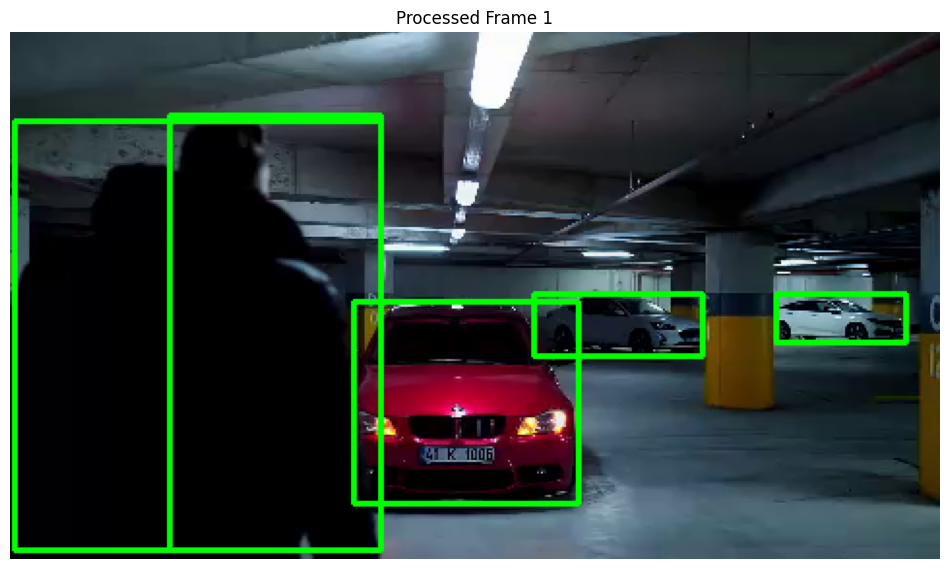


0: 384x640 2 persons, 3 cars, 194.4ms
Speed: 5.2ms preprocess, 194.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


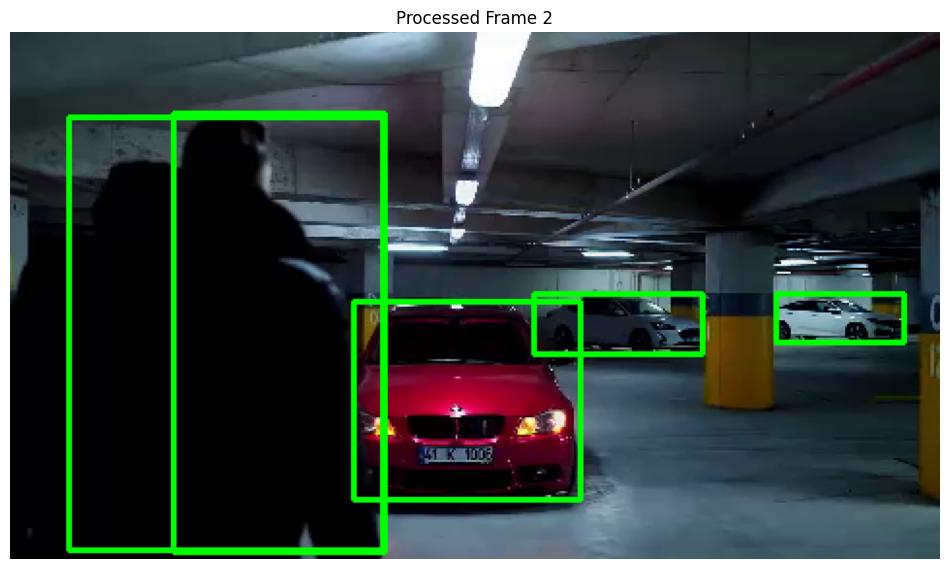


0: 384x640 2 persons, 3 cars, 186.3ms
Speed: 4.9ms preprocess, 186.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


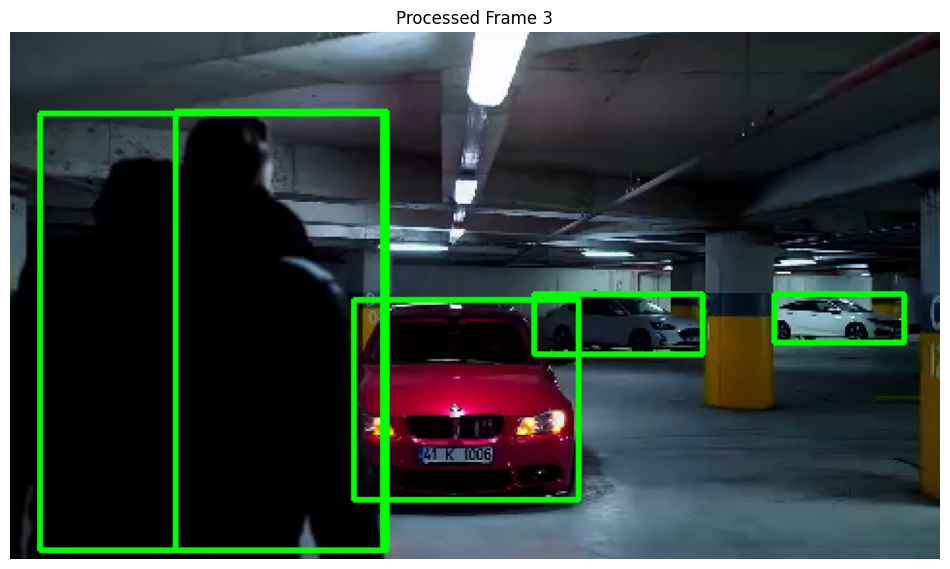


0: 384x640 1 person, 3 cars, 203.2ms
Speed: 4.6ms preprocess, 203.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


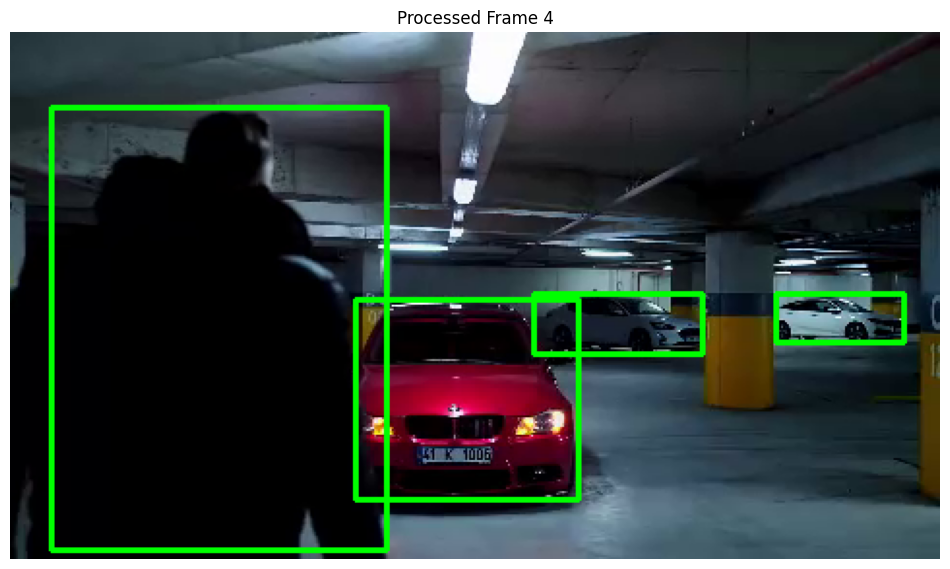


0: 384x640 1 person, 3 cars, 221.4ms
Speed: 4.1ms preprocess, 221.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


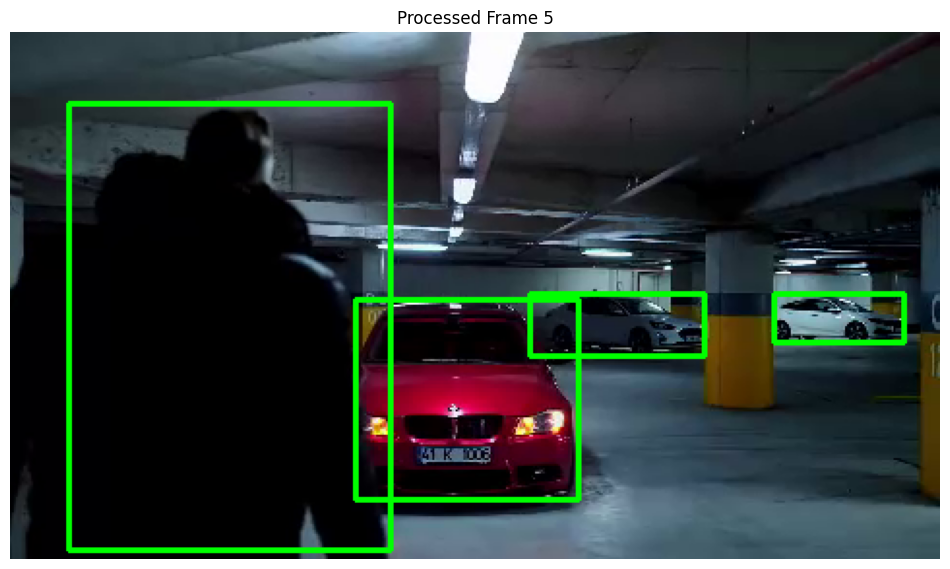


Detected Number Plates from all frames:
Frame 1: No plate detected
Frame 2: No plate detected
Frame 3: No plate detected
Frame 4: No plate detected
Frame 5: No plate detected


In [ ]:
# Cell 5: Process the video
# Provide path to your input video
video_path = r"2.mp4"  # <-- change this to your video file
cap = cv2.VideoCapture(video_path)
frame_count = 0

# List to store detected number plates for each frame
all_detected_plates = []

# Process first 5 frames
while cap.isOpened() and frame_count < 5:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # YOLOv8 Detection on the frame
    results = yolo_model(frame)

    detected_texts = []  # Temporary list for current frame

    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        clss = result.boxes.cls.cpu().numpy()

        for box, conf, cls in zip(boxes, confs, clss):
            x1, y1, x2, y2 = map(int, box)
            # Draw YOLO box
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Crop detected region
            crop = frame[y1:y2, x1:x2]

            # OCR Detection on cropped region
            ocr_result = ocr_reader.readtext(crop)

            # Extract and store OCR result
            for (bbox, text, prob) in ocr_result:
                if prob > 0.5:
                    detected_texts.append(text)  # Store detected text

                    # Display OCR result on the frame
                    cv2.putText(frame, text.replace(" ", ""), (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    print(f"Frame {frame_count}: OCR Detected Text: {text}")

    # Store detected plate without spaces for this frame
    full_plate = "".join(detected_texts) if detected_texts else "No plate detected"
    all_detected_plates.append(full_plate)

    # Display frame inside notebook
    show_image(frame, title=f"Processed Frame {frame_count}")

cap.release()

# Print detected plates after processing all frames
print("\nDetected Number Plates from all frames:")
for i, plate in enumerate(all_detected_plates, 1):
    print(f"Frame {i}: {plate}")

In [ ]:
import pandas as pd

# Load the Excel file
excel_path = "Vehicle License plate.xlsx"  # Update this to your actual file path
df = pd.read_excel(excel_path)

# Ensure column name matches exactly
column_name = "License Plate"  # Match this exactly with the Excel column

# Print all values in the column before checking
print("License Plate Column from Excel:")
print(df[column_name])

# Normalize authorized vehicles (convert to uppercase and remove spaces)
authorized_vehicles = set(df[column_name].astype(str).str.replace(" ", "").str.upper())

# Print cleaned authorized vehicles for verification
print("\nCleaned Authorized Vehicles:")
print(authorized_vehicles)

# Normalize detected plates (convert to uppercase and remove spaces)
normalized_detected_plates = {plate.replace(" ", "").upper() for plate in all_detected_plates}

# Print cleaned detected plates for debugging
print("\nNormalized Detected Plates:")
print(normalized_detected_plates)

# Check if any detected plate matches an authorized one
if any(plate in authorized_vehicles for plate in normalized_detected_plates):
    print("\nAuthorized Vehicle")
else:
    print("\nUnauthorized Vehicle")


License Plate Column from Excel:
0    CA455-822
1      DS196EY
2      41K1006
3      FC633YZ
4     CB0600CA
5     06EFK521
6     06CUE710
Name: License Plate, dtype: object

Cleaned Authorized Vehicles:
{'41K1006', 'FC633YZ', 'DS196EY', '06EFK521', '06CUE710', 'CA455-822', 'CB0600CA'}

Normalized Detected Plates:
{'CBOGODCA', 'CBOGOOCA', 'NOPLATEDETECTED'}

Unauthorized Vehicle



0: 640x384 1 car, 125.6ms
Speed: 4.0ms preprocess, 125.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)


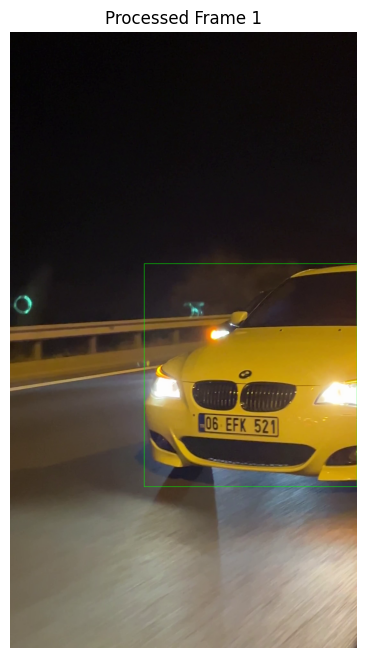


0: 640x384 1 car, 144.8ms
Speed: 2.6ms preprocess, 144.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)


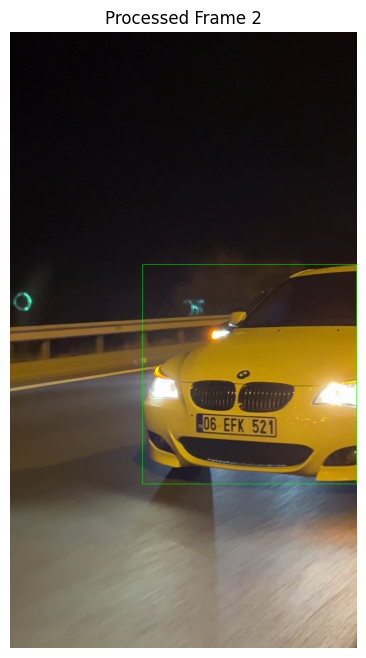


0: 640x384 1 car, 181.6ms
Speed: 2.8ms preprocess, 181.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)


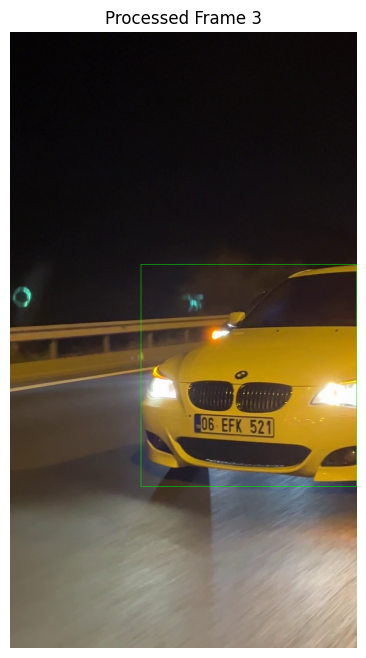


0: 640x384 1 car, 133.4ms
Speed: 2.4ms preprocess, 133.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)


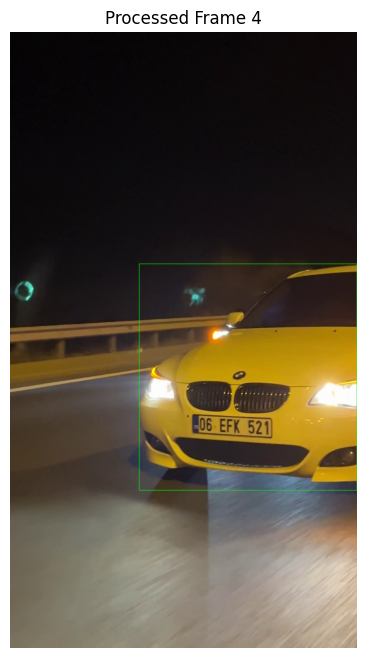


0: 640x384 1 car, 148.6ms
Speed: 4.3ms preprocess, 148.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)


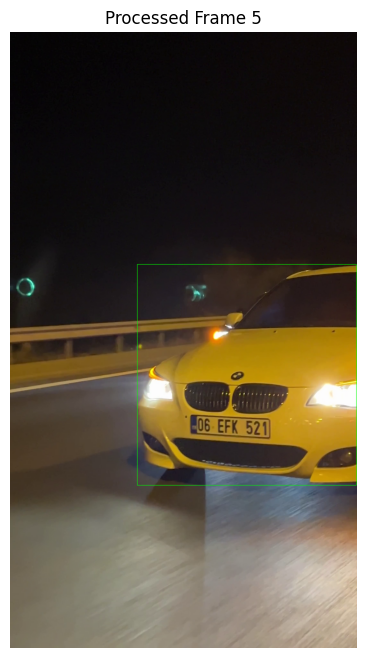


Detected Number Plates from all frames:
Frame 1: No plate detected
Frame 2: No plate detected
Frame 3: No plate detected
Frame 4: No plate detected
Frame 5: No plate detected


In [ ]:
# Cell 5: Process the video
# Provide path to your input video
video_path = r"11939614_2160_3840_60fps.mp4"  # <-- change this to your video file
cap = cv2.VideoCapture(video_path)
frame_count = 0

# List to store detected number plates for each frame
all_detected_plates = []

# Process first 5 frames
while cap.isOpened() and frame_count < 5:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # YOLOv8 Detection on the frame
    results = yolo_model(frame)

    detected_texts = []  # Temporary list for current frame

    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        clss = result.boxes.cls.cpu().numpy()

        for box, conf, cls in zip(boxes, confs, clss):
            x1, y1, x2, y2 = map(int, box)
            # Draw YOLO box
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Crop detected region
            crop = frame[y1:y2, x1:x2]

            # OCR Detection on cropped region
            ocr_result = ocr_reader.readtext(crop)

            # Extract and store OCR result
            for (bbox, text, prob) in ocr_result:
                if prob > 0.5:
                    detected_texts.append(text)  # Store detected text

                    # Display OCR result on the frame
                    cv2.putText(frame, text.replace(" ", ""), (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    print(f"Frame {frame_count}: OCR Detected Text: {text}")

    # Store detected plate without spaces for this frame
    full_plate = "".join(detected_texts) if detected_texts else "No plate detected"
    all_detected_plates.append(full_plate)

    # Display frame inside notebook
    show_image(frame, title=f"Processed Frame {frame_count}")

cap.release()

# Print detected plates after processing all frames
print("\nDetected Number Plates from all frames:")
for i, plate in enumerate(all_detected_plates, 1):
    print(f"Frame {i}: {plate}")

In [ ]:
import pandas as pd

# Load the Excel file
excel_path = "Vehicle License plate.xlsx"  # Update this to your actual file path
df = pd.read_excel(excel_path)

# Ensure column name matches exactly
column_name = "License Plate"  # Match this exactly with the Excel column

# Print all values in the column before checking
print("License Plate Column from Excel:")
print(df[column_name])

# Normalize authorized vehicles (convert to uppercase and remove spaces)
authorized_vehicles = set(df[column_name].astype(str).str.replace(" ", "").str.upper())

# Print cleaned authorized vehicles for verification
print("\nCleaned Authorized Vehicles:")
print(authorized_vehicles)

# Normalize detected plates (convert to uppercase and remove spaces)
normalized_detected_plates = {plate.replace(" ", "").upper() for plate in all_detected_plates}

# Print cleaned detected plates for debugging
print("\nNormalized Detected Plates:")
print(normalized_detected_plates)

# Check if any detected plate matches an authorized one
if any(plate in authorized_vehicles for plate in normalized_detected_plates):
    print("\nAuthorized Vehicle")
else:
    print("\nUnauthorized Vehicle")

License Plate Column from Excel:
0    CA455-822
1      DS196EY
2      41K1006
3      FC633YZ
4     CB0600CA
5     06EFK521
6     06CUE710
Name: License Plate, dtype: object

Cleaned Authorized Vehicles:
{'41K1006', 'FC633YZ', 'DS196EY', '06EFK521', '06CUE710', 'CA455-822', 'CB0600CA'}

Normalized Detected Plates:
{'NOPLATEDETECTED'}

Unauthorized Vehicle



0: 384x640 5 cars, 106.3ms
Speed: 2.2ms preprocess, 106.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)
Frame 1: OCR Detected Text: C455 8


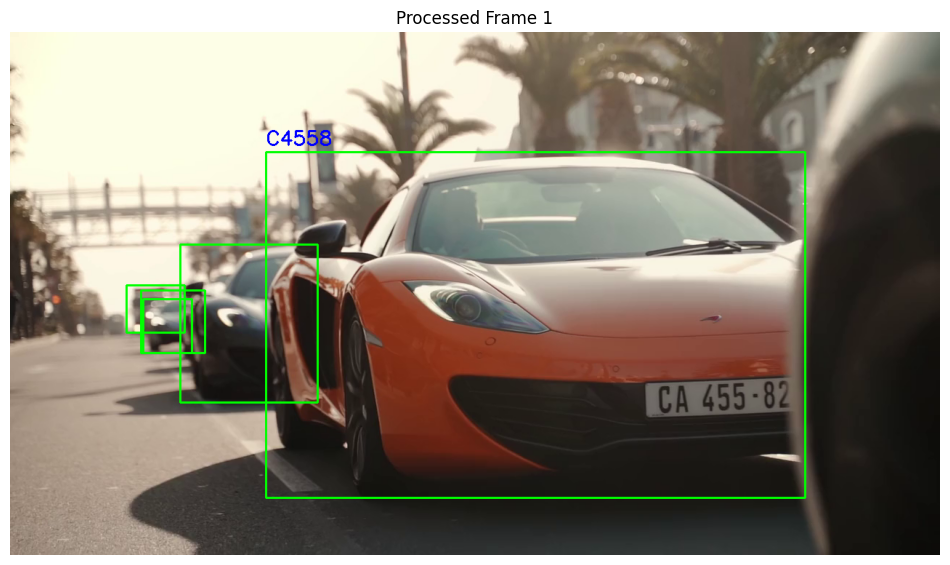


0: 384x640 5 cars, 134.2ms
Speed: 2.0ms preprocess, 134.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


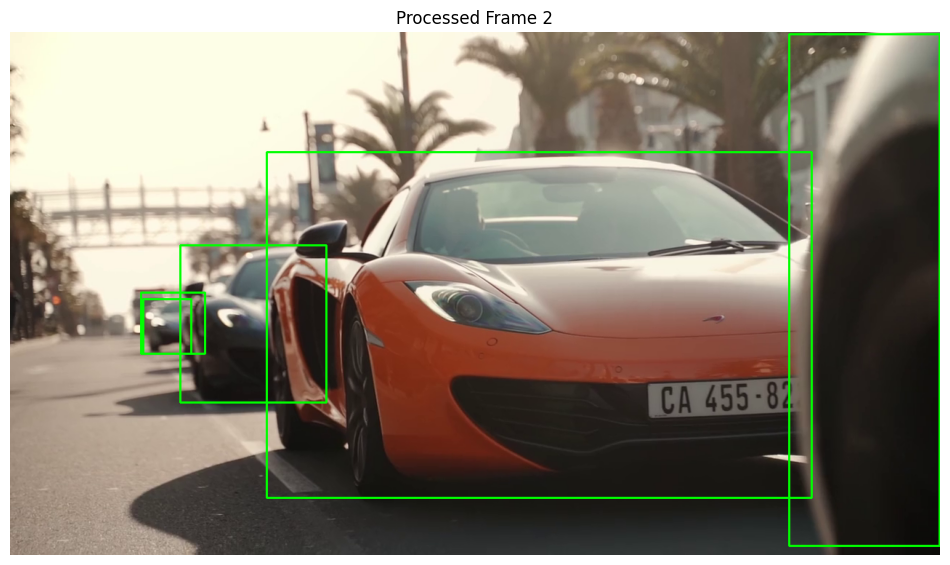


0: 384x640 6 cars, 115.1ms
Speed: 1.7ms preprocess, 115.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


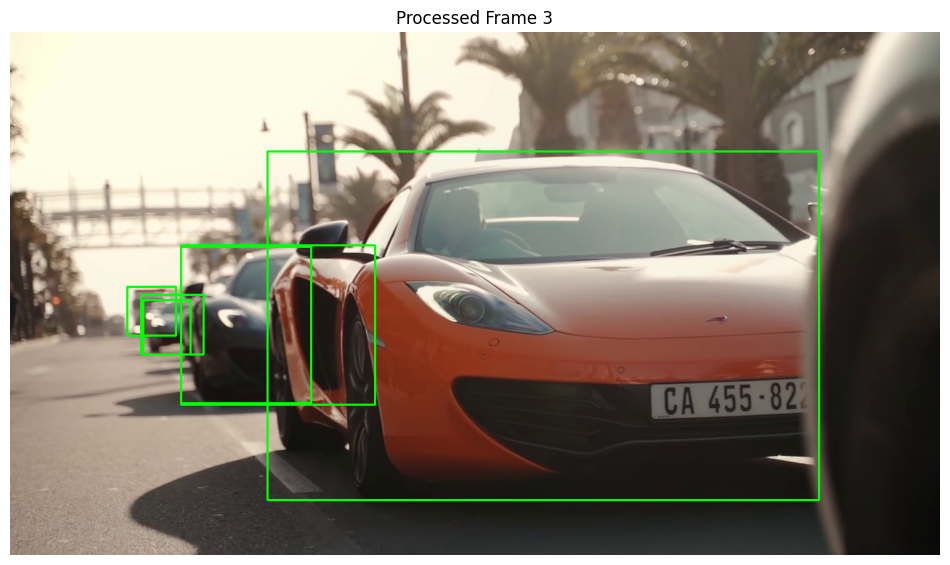


0: 384x640 7 cars, 124.4ms
Speed: 2.0ms preprocess, 124.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


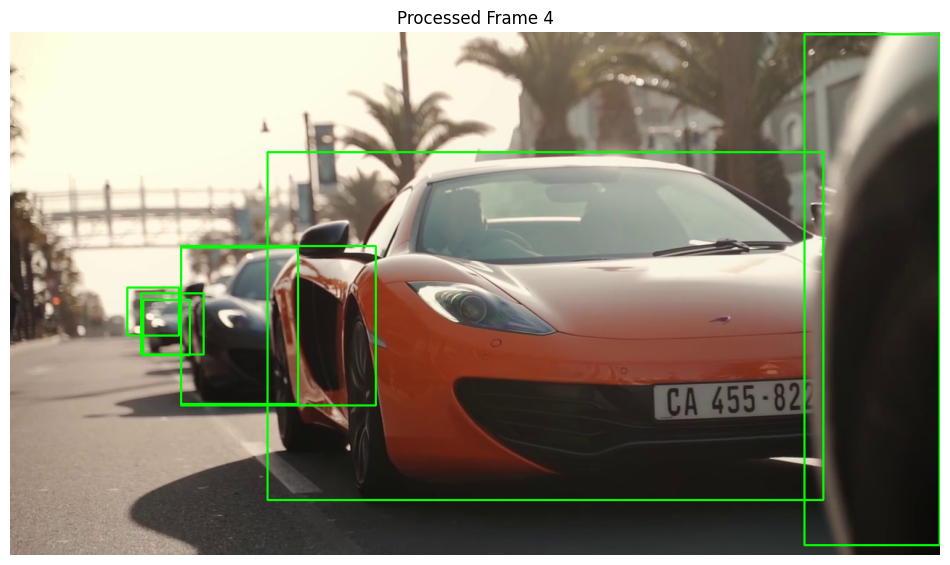


0: 384x640 6 cars, 138.0ms
Speed: 2.2ms preprocess, 138.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)
Frame 5: OCR Detected Text: CA 455 822


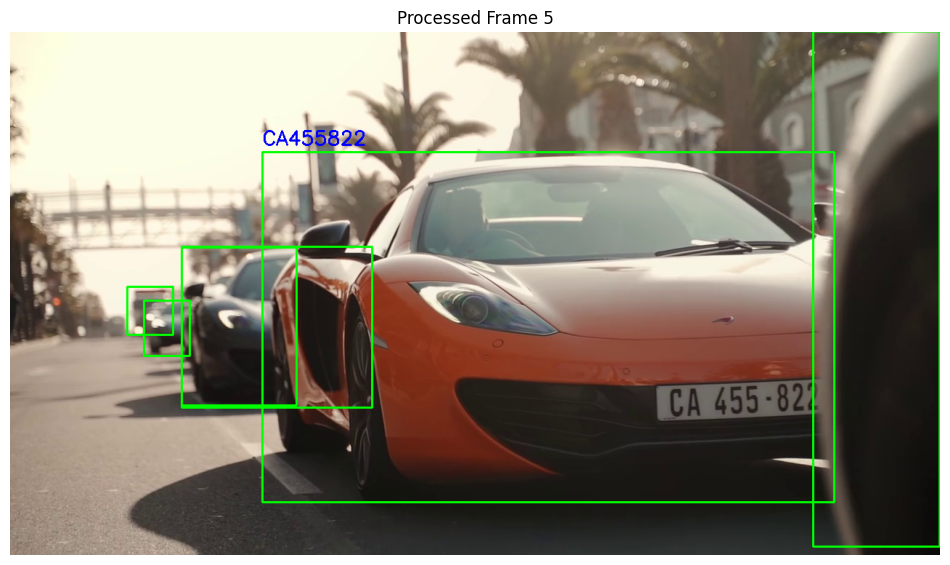


Detected Number Plates from all frames:
Frame 1: C455 8
Frame 2: No plate detected
Frame 3: No plate detected
Frame 4: No plate detected
Frame 5: CA 455 822


In [ ]:
# Cell 5: Process the video
# Provide path to your input video
video_path = r"4.mp4"  # <-- change this to your video file
cap = cv2.VideoCapture(video_path)
frame_count = 0

# List to store detected number plates for each frame
all_detected_plates = []

# Process first 5 frames
while cap.isOpened() and frame_count < 5:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # YOLOv8 Detection on the frame
    results = yolo_model(frame)

    detected_texts = []  # Temporary list for current frame

    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        clss = result.boxes.cls.cpu().numpy()

        for box, conf, cls in zip(boxes, confs, clss):
            x1, y1, x2, y2 = map(int, box)
            # Draw YOLO box
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Crop detected region
            crop = frame[y1:y2, x1:x2]

            # OCR Detection on cropped region
            ocr_result = ocr_reader.readtext(crop)

            # Extract and store OCR result
            for (bbox, text, prob) in ocr_result:
                if prob > 0.5:
                    detected_texts.append(text)  # Store detected text

                    # Display OCR result on the frame
                    cv2.putText(frame, text.replace(" ", ""), (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    print(f"Frame {frame_count}: OCR Detected Text: {text}")

    # Store detected plate without spaces for this frame
    full_plate = "".join(detected_texts) if detected_texts else "No plate detected"
    all_detected_plates.append(full_plate)

    # Display frame inside notebook
    show_image(frame, title=f"Processed Frame {frame_count}")

cap.release()

# Print detected plates after processing all frames
print("\nDetected Number Plates from all frames:")
for i, plate in enumerate(all_detected_plates, 1):
    print(f"Frame {i}: {plate}")

In [ ]:
import pandas as pd

# Load the Excel file
excel_path = "Vehicle License plate (2).xlsx"  # Update this to your actual file path
df = pd.read_excel(excel_path)

# Ensure column name matches exactly
column_name = "License Plate"  # Match this exactly with the Excel column

# Print all values in the column before checking
print("License Plate Column from Excel:")
print(df[column_name])

# Normalize authorized vehicles (convert to uppercase and remove spaces)
authorized_vehicles = set(df[column_name].astype(str).str.replace(" ", "").str.upper())

# Print cleaned authorized vehicles for verification
print("\nCleaned Authorized Vehicles:")
print(authorized_vehicles)

# Normalize detected plates (convert to uppercase and remove spaces)
normalized_detected_plates = {plate.replace(" ", "").upper() for plate in all_detected_plates}

# Print cleaned detected plates for debugging
print("\nNormalized Detected Plates:")
print(normalized_detected_plates)

# Check if any detected plate matches an authorized one
if any(plate in authorized_vehicles for plate in normalized_detected_plates):
    print("\nAuthorized Vehicle")
else:
    print("\nUnauthorized Vehicle")

License Plate Column from Excel:
0      CA455822
1       DS196EY
2       41K1006
3       FC633YZ
4      CB0600CA
5      06EFK521
6      06CUE710
7    MH49CL5498
Name: License Plate, dtype: object

Cleaned Authorized Vehicles:
{'CA455822', '41K1006', 'FC633YZ', 'DS196EY', '06EFK521', '06CUE710', 'MH49CL5498', 'CB0600CA'}

Normalized Detected Plates:
{'CA455822', 'NOPLATEDETECTED', 'C4558'}

Authorized Vehicle



0: 640x384 2 cars, 2 trucks, 94.8ms
Speed: 5.7ms preprocess, 94.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)


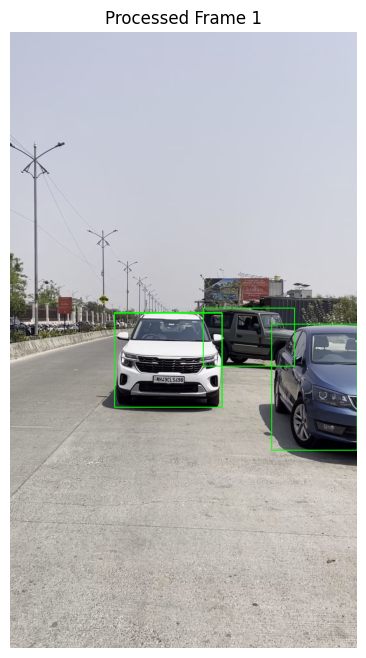


0: 640x384 2 cars, 2 trucks, 133.8ms
Speed: 2.7ms preprocess, 133.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)


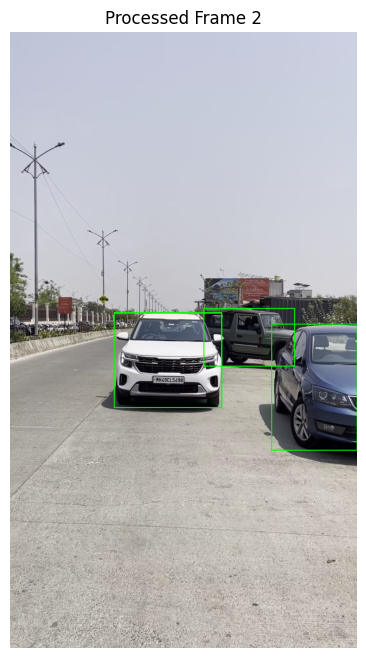


0: 640x384 2 cars, 2 trucks, 127.7ms
Speed: 4.6ms preprocess, 127.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)
Frame 3: OCR Detected Text: MHL9CL5498


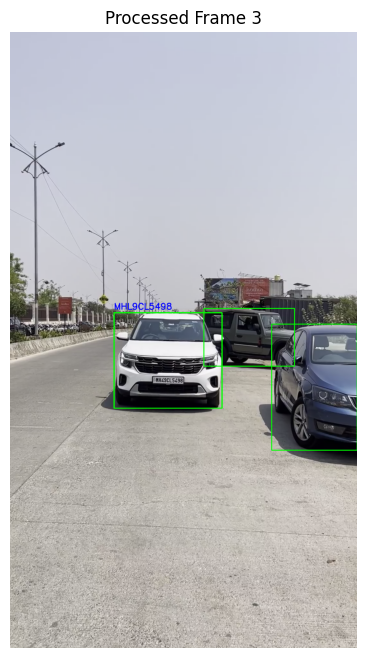


0: 640x384 2 cars, 2 trucks, 122.2ms
Speed: 2.6ms preprocess, 122.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 384)


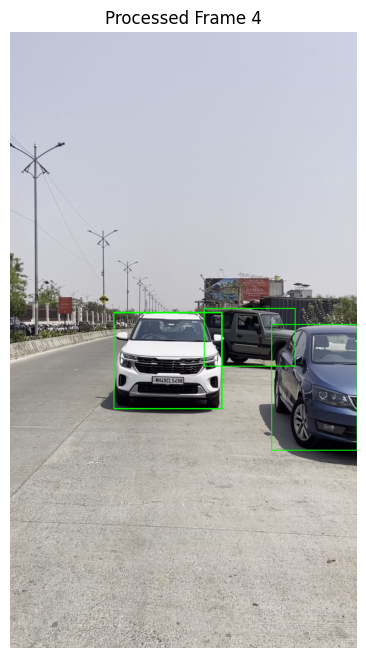


0: 640x384 2 cars, 2 trucks, 124.3ms
Speed: 2.8ms preprocess, 124.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 384)
Frame 5: OCR Detected Text: MHL9CL5498]


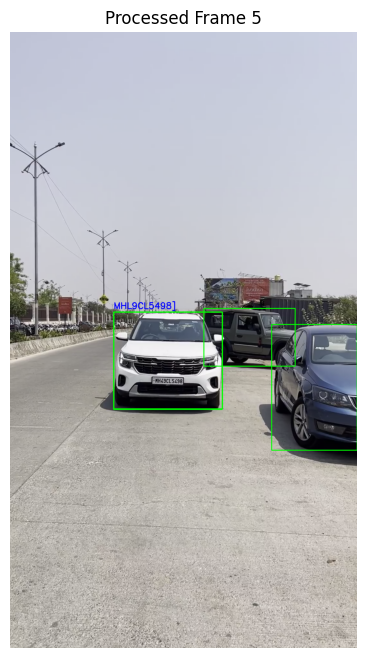


Detected Number Plates from all frames:
Frame 1: No plate detected
Frame 2: No plate detected
Frame 3: MHL9CL5498
Frame 4: No plate detected
Frame 5: MHL9CL5498]


In [ ]:
# Cell 5: Process the video
# Provide path to your input video
video_path = r"IMG_3203.mp4"  # <-- change this to your video file
cap = cv2.VideoCapture(video_path)
frame_count = 0

# List to store detected number plates for each frame
all_detected_plates = []

# Process first 5 frames
while cap.isOpened() and frame_count < 5:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # YOLOv8 Detection on the frame
    results = yolo_model(frame)

    detected_texts = []  # Temporary list for current frame

    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        clss = result.boxes.cls.cpu().numpy()

        for box, conf, cls in zip(boxes, confs, clss):
            x1, y1, x2, y2 = map(int, box)
            # Draw YOLO box
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Crop detected region
            crop = frame[y1:y2, x1:x2]

            # OCR Detection on cropped region
            ocr_result = ocr_reader.readtext(crop)

            # Extract and store OCR result
            for (bbox, text, prob) in ocr_result:
                if prob > 0.5:
                    detected_texts.append(text)  # Store detected text

                    # Display OCR result on the frame
                    cv2.putText(frame, text.replace(" ", ""), (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    print(f"Frame {frame_count}: OCR Detected Text: {text}")

    # Store detected plate without spaces for this frame
    full_plate = "".join(detected_texts) if detected_texts else "No plate detected"
    all_detected_plates.append(full_plate)

    # Display frame inside notebook
    show_image(frame, title=f"Processed Frame {frame_count}")

cap.release()

# Print detected plates after processing all frames
print("\nDetected Number Plates from all frames:")
for i, plate in enumerate(all_detected_plates, 1):
    print(f"Frame {i}: {plate}")

In [ ]:
import pandas as pd

# Load the Excel file
excel_path = "Vehicle License plate.xlsx"  # Update this to your actual file path
df = pd.read_excel(excel_path)

# Ensure column name matches exactly
column_name = "License Plate"  # Match this exactly with the Excel column

# Print all values in the column before checking
print("License Plate Column from Excel:")
print(df[column_name])

# Normalize authorized vehicles (convert to uppercase and remove spaces)
authorized_vehicles = set(df[column_name].astype(str).str.replace(" ", "").str.upper())

# Print cleaned authorized vehicles for verification
print("\nCleaned Authorized Vehicles:")
print(authorized_vehicles)

# Normalize detected plates (convert to uppercase and remove spaces)
normalized_detected_plates = {plate.replace(" ", "").upper() for plate in all_detected_plates}

# Print cleaned detected plates for debugging
print("\nNormalized Detected Plates:")
print(normalized_detected_plates)

# Check if any detected plate matches an authorized one
if any(plate in authorized_vehicles for plate in normalized_detected_plates):
    print("\nAuthorized Vehicle")
else:
    print("\nUnauthorized Vehicle")

License Plate Column from Excel:
0     CA455-822
1       DS196EY
2       41K1006
3       FC633YZ
4      CB0600CA
5      06EFK521
6      06CUE710
7    MH49CL5498
Name: License Plate, dtype: object

Cleaned Authorized Vehicles:
{'41K1006', 'FC633YZ', 'DS196EY', '06EFK521', '06CUE710', 'CA455-822', 'MH49CL5498', 'CB0600CA'}

Normalized Detected Plates:
{'NOPLATEDETECTED', 'MHL9CL5498', 'MHL9CL5498]'}

Unauthorized Vehicle
